# Spatial Transcriptomics DE Pipeline — Half Brain
**QC rule:** a gene is kept if detected in ≥ 3 spots in ≥ 3 of 4 samples
within **at least one** experimental group.

**Workflow:**
0. Imports & Setup
1. Read Visium data → individual h5ad
2. Concatenate into unified AnnData
3. Quality Control (violin plots before & after)
4. Normalization
5. Feature Selection (HVGs)
7. PCA-Loading Gene Filtering
8. Clustering & UMAP
9. Pseudobulk Construction
10. Differential Expression (Welch t-test)
11. Volcano Plots
12. Summary

## 0 · Imports & Setup

In [132]:
import scanpy as sc
import squidpy as sq
import anndata as ad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from scipy import sparse, stats
from statsmodels.stats.multitest import multipletests
from kneed import KneeLocator
import os, shutil, warnings

try:
    from adjustText import adjust_text
    _HAS_ADJUSTTEXT = True
    print("✓ adjustText loaded — volcano labels will be auto-repelled")
except ImportError:
    _HAS_ADJUSTTEXT = False
    print("⚠ adjustText not installed — using manual offset for volcano labels")
    print("  Install with: pip install adjustText")

warnings.filterwarnings("ignore", category=FutureWarning)
sc.settings.verbosity = 2
sc.settings.set_figure_params(dpi=150, facecolor="white", frameon=False)


⚠ adjustText not installed — using manual offset for volcano labels
  Install with: pip install adjustText


In [133]:

# --- Paths -------------------------------------------------------------------
VISIUM_INPUT_FOLDER          = "/opt/Data/RNA Seq 2025"
H5AD_OUTPUT_PATH             = "/home/ajarrah/PhD_Thesis/gene_paper/h5ad_data/"
AGGREGATED_H5AD_OUTPUT_PATH  = "/home/ajarrah/PhD_Thesis/gene_paper/aggregated_h5ad_data/"
FILE_NAME_LIST_CSV           = "/home/ajarrah/PhD_Thesis/gene_paper/csv_data/file_name_list.csv"
FIGURE_DIR                   = f"figures_halfbrain"
RESULTS_DIR                  = f"results_halfbrain"

SAVE_AGGREGATED = False

for d in [H5AD_OUTPUT_PATH, AGGREGATED_H5AD_OUTPUT_PATH, FIGURE_DIR, RESULTS_DIR]:
    os.makedirs(d, exist_ok=True)

sc.settings.figdir = FIGURE_DIR


In [134]:
# --- Sample definitions (single source of truth) -----------------------------
SAMPLE_DEFS = {
    "A1_Young_Control_Mouse_Brain_202502": ("YC_1",  "YC",  "Control", "Young", "1-1"),
    "B1_Young_Control_Mouse_Brain_202502": ("YC_2",  "YC",  "Control", "Young", "1-2"),
    "C1_Young_Control_Mouse_Brain_202502": ("YC_3",  "YC",  "Control", "Young", "1-3"),
    "D1_Young_Control_Mouse_Brain_202502": ("YC_4",  "YC",  "Control", "Young", "1-4"),
    "A1_Young_AD_Mouse_Brain_202502":      ("YAD_1", "YAD", "AD",      "Young", "2-1"),
    "B1_Young_AD_Mouse_Brain_202502":      ("YAD_2", "YAD", "AD",      "Young", "2-2"),
    "C1_Young_AD_Mouse_Brain_202502":      ("YAD_3", "YAD", "AD",      "Young", "2-3"),
    "D1_Young_AD_Mouse_Brain_202502":      ("YAD_4", "YAD", "AD",      "Young", "2-4"),
    "A1_Aged_Control_Mouse_Brain_202502":  ("AC_1",  "AC",  "Control", "Aged",  "3-1"),
    "B1_Aged_Control_Mouse_Brain_202502":  ("AC_2",  "AC",  "Control", "Aged",  "3-2"),
    "C1_Aged_Control_Mouse_Brain_202502":  ("AC_3",  "AC",  "Control", "Aged",  "3-2"),
    "D1_Aged_Control_Mouse_Brain_202502":  ("AC_4",  "AC",  "Control", "Aged",  "3-4"),
    "A1_Aged_AD_Mouse_Brain_202502":       ("AAD_1", "AAD", "AD",      "Aged",  "4-1"),
    "B1_Aged_AD_Mouse_Brain_202502":       ("AAD_2", "AAD", "AD",      "Aged",  "4-2"),
    "C1_Aged_AD_Mouse_Brain_202502":       ("AAD_3", "AAD", "AD",      "Aged",  "4-3"),
    "D1_Aged_AD_Mouse_Brain_202502":       ("AAD_4", "AAD", "AD",      "Aged",  "4-4"),
}

SAMPLE_ORDER = [
    "YC_1",  "YC_2",  "YC_3",  "YC_4",
    "YAD_1", "YAD_2", "YAD_3", "YAD_4",
    "AC_1",  "AC_2",  "AC_3",  "AC_4",
    "AAD_1", "AAD_2", "AAD_3", "AAD_4",
]

SHORT_TO_ORIG = {v[0]: k for k, v in SAMPLE_DEFS.items()}


In [135]:
# --- User-defined comparisons ------------------------------------------------
COMPARISONS = [
    {
        "name": "AD_vs_Control",
        "desc": "All AD vs All Control",
        "group1_filter": {"Condition": "AD"},
        "group2_filter": {"Condition": "Control"},
    },
    {
        "name": "Aged_vs_Young",
        "desc": "All Aged vs All Young",
        "group1_filter": {"Age": "Aged"},
        "group2_filter": {"Age": "Young"},
    },
    {
        "name": "YAD_vs_YC",
        "desc": "Young AD vs Young Control",
        "group1_filter": {"Age": "Young", "Condition": "AD"},
        "group2_filter": {"Age": "Young", "Condition": "Control"},
    },
    {
        "name": "AAD_vs_AC",
        "desc": "Aged AD vs Aged Control",
        "group1_filter": {"Age": "Aged", "Condition": "AD"},
        "group2_filter": {"Age": "Aged", "Condition": "Control"},
    },
    {
        "name": "AC_vs_YC",
        "desc": "Aged Control vs Young Control (aging effect)",
        "group1_filter": {"Age": "Aged",  "Condition": "Control"},
        "group2_filter": {"Age": "Young", "Condition": "Control"},
    },
    {
        "name": "AAD_vs_YAD",
        "desc": "Aged AD vs Young AD",
        "group1_filter": {"Age": "Aged",  "Condition": "AD"},
        "group2_filter": {"Age": "Young", "Condition": "AD"},
    },
]


In [136]:
# --- Helper functions ---------------------------------------------------------

_PALETTE = [
    "#c0392b", "#2980b9", "#8e44ad", "#27ae60", "#d35400",
    "#2c3e50", "#16a085", "#e67e22", "#1abc9c", "#e74c3c",
]
comp_labels = {c["name"]: c["desc"] for c in COMPARISONS}
comp_colors = {c["name"]: _PALETTE[i % len(_PALETTE)]
               for i, c in enumerate(COMPARISONS)}


def build_mask(obs_df, filt):
    mask = pd.Series(True, index=obs_df.index)
    for col, val in filt.items():
        if col not in obs_df.columns:
            raise KeyError(f"Filter column '{col}' not found. Available: {list(obs_df.columns)}")
        if isinstance(val, (list, tuple)):
            mask &= obs_df[col].isin(val)
        else:
            mask &= obs_df[col] == val
    return mask


def describe_filter(filt):
    parts = []
    for col, val in filt.items():
        if isinstance(val, (list, tuple)):
            parts.append(f"{col}∈{{{', '.join(val)}}}")
        else:
            parts.append(f"{col}={val}")
    return " & ".join(parts)


def check_disk_space(path, required_gb=1.0):
    try:
        usage = shutil.disk_usage(os.path.dirname(os.path.abspath(path)))
        free_gb = usage.free / (1024 ** 3)
        print(f"  Disk space available at {path}: {free_gb:.1f} GB")
        if free_gb < required_gb:
            print(f"  ⚠ WARNING: Less than {required_gb} GB free!")
            return False
        return True
    except Exception:
        return True


def safe_write_h5ad(adata_obj, filepath, compression="gzip"):
    check_disk_space(filepath, required_gb=0.5)
    try:
        adata_obj.write(filepath, compression=compression)
        print(f"  ✓ Saved: {filepath}")
    except OSError as e:
        print(f"  ✗ WRITE FAILED: {e}")
        if os.path.exists(filepath):
            os.remove(filepath)
        raise


## 1 · Read Visium Data → Individual h5ad Files

In [137]:
file_name_list = sorted(os.listdir(VISIUM_INPUT_FOLDER))
pd.DataFrame(file_name_list, columns=["file_name"]).to_csv(FILE_NAME_LIST_CSV, index=False)
print(f"Found {len(file_name_list)} samples in {VISIUM_INPUT_FOLDER}")

for sample_folder in file_name_list:
    if sample_folder not in SAMPLE_DEFS:
        print(f"  ⚠ Skipping unrecognized folder: {sample_folder}")
        continue

    short_key, group, condition, age, code_id = SAMPLE_DEFS[sample_folder]
    out_path = os.path.join(H5AD_OUTPUT_PATH, f"{sample_folder}.h5ad")

    if os.path.exists(out_path):
        print(f"  Skipping {sample_folder} -> {short_key} (already exists)")
        continue

    print(f"  Reading {sample_folder} -> {short_key}")
    a = sc.read_visium(os.path.join(VISIUM_INPUT_FOLDER, sample_folder, "outs"))
    a.obs["Original_Name"] = sample_folder
    a.obs["Sample_Code"]   = code_id
    a.obs["Group"]         = group
    a.var_names_make_unique()
    safe_write_h5ad(a, out_path)
    del a


Found 16 samples in /opt/Data/RNA Seq 2025
  Skipping A1_Aged_AD_Mouse_Brain_202502 -> AAD_1 (already exists)
  Skipping A1_Aged_Control_Mouse_Brain_202502 -> AC_1 (already exists)
  Skipping A1_Young_AD_Mouse_Brain_202502 -> YAD_1 (already exists)
  Skipping A1_Young_Control_Mouse_Brain_202502 -> YC_1 (already exists)
  Skipping B1_Aged_AD_Mouse_Brain_202502 -> AAD_2 (already exists)
  Skipping B1_Aged_Control_Mouse_Brain_202502 -> AC_2 (already exists)
  Skipping B1_Young_AD_Mouse_Brain_202502 -> YAD_2 (already exists)
  Skipping B1_Young_Control_Mouse_Brain_202502 -> YC_2 (already exists)
  Skipping C1_Aged_AD_Mouse_Brain_202502 -> AAD_3 (already exists)
  Skipping C1_Aged_Control_Mouse_Brain_202502 -> AC_3 (already exists)
  Skipping C1_Young_AD_Mouse_Brain_202502 -> YAD_3 (already exists)
  Skipping C1_Young_Control_Mouse_Brain_202502 -> YC_3 (already exists)
  Skipping D1_Aged_AD_Mouse_Brain_202502 -> AAD_4 (already exists)
  Skipping D1_Aged_Control_Mouse_Brain_202502 -> AC_4 (a

## 2 · Concatenate into Unified AnnData

In [138]:
adatas_for_agg = [] if SAVE_AGGREGATED else None
adatas_for_analysis = []

for short_key in SAMPLE_ORDER:
    orig_name = SHORT_TO_ORIG[short_key]
    _, group, condition, age, code_id = SAMPLE_DEFS[orig_name]
    filepath = os.path.join(H5AD_OUTPUT_PATH, f"{orig_name}.h5ad")

    a = sc.read_h5ad(filepath)

    if SAVE_AGGREGATED:
        adatas_for_agg.append(a.copy())

    a.obs["Sample"]    = short_key
    a.obs["Group"]     = group
    a.obs["Condition"] = condition
    a.obs["Age"]       = age
    a.obs_names = [f"{short_key}_{x}" for x in a.obs_names]
    a.obs_names_make_unique()
    adatas_for_analysis.append(a)

if SAVE_AGGREGATED:
    print("Building aggregated spatial object...")
    adata_agg = sc.concat(
        adatas_for_agg, label="Sample", keys=SAMPLE_ORDER, uns_merge="unique"
    )
    for short_key, a_orig in zip(SAMPLE_ORDER, adatas_for_agg):
        if "spatial" not in a_orig.uns:
            continue
        inner_key = next(iter(a_orig.uns["spatial"].keys()))
        if inner_key in adata_agg.uns.get("spatial", {}):
            spatial_dict = adata_agg.uns["spatial"]
            if short_key != inner_key:
                spatial_dict[short_key] = spatial_dict.pop(inner_key)
    agg_path = os.path.join(AGGREGATED_H5AD_OUTPUT_PATH, "aggregated_mouse_brain_202502.h5ad")
    safe_write_h5ad(adata_agg, agg_path)
    print(f"Aggregated object saved: {adata_agg.shape}")
    del adata_agg, adatas_for_agg
else:
    print("Skipping aggregated h5ad save (SAVE_AGGREGATED=False).")

adata = ad.concat(adatas_for_analysis, join="inner", merge="first")
adata.obs_names_make_unique()
del adatas_for_analysis
print(f"Analysis object: {adata.shape}")


Skipping aggregated h5ad save (SAVE_AGGREGATED=False).
Analysis object: (43020, 32285)


## 3 · Quality Control

### 3a — QC Metrics BEFORE Filtering

In [139]:
# --- Remove all-zero genes ---------------------------------------------------
if sparse.issparse(adata.X):
    mask = np.array(adata.X.sum(axis=0) != 0).ravel()
else:
    mask = adata.X.sum(axis=0) != 0
adata = adata[:, mask].copy()

# --- Mitochondrial & ribosomal flags -----------------------------------------
adata.var["mt"]   = adata.var_names.str.startswith("mt-")
adata.var["ribo"] = adata.var_names.str.match("^(Rpl|Rps)")

sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo"], inplace=True)

print(f"Shape before QC filtering: {adata.shape}")


Shape before QC filtering: (43020, 24908)


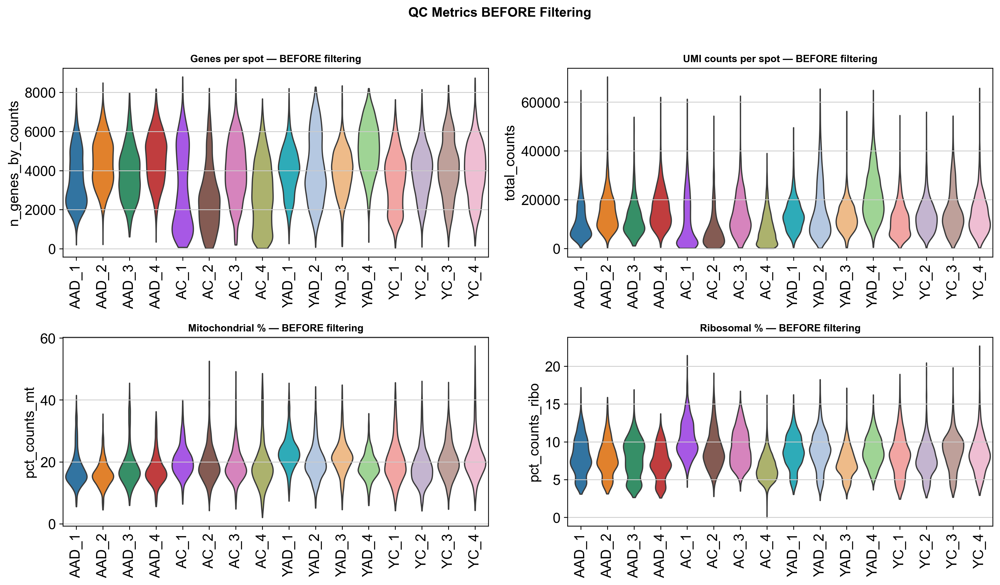

In [140]:
# --- Violin plots BEFORE filtering -------------------------------------------
qc_keys = ["n_genes_by_counts", "total_counts", "pct_counts_mt", "pct_counts_ribo"]
qc_titles = ["Genes per spot", "UMI counts per spot", "Mitochondrial %", "Ribosomal %"]

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.ravel()

for ax, key, title in zip(axes, qc_keys, qc_titles):
    sc.pl.violin(adata, key, groupby="Sample", rotation=90, ax=ax, show=False,
                 stripplot=False)
    ax.set_title(f"{title} — BEFORE filtering", fontsize=10, fontweight="bold")
    ax.set_ylabel(key)

plt.suptitle("QC Metrics BEFORE Filtering", fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()


### 3b — Apply Filters

In [141]:
# --- Cell/spot filter --------------------------------------------------------
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, max_cells=20)
sc.pp.filter_genes(adata, min_cells=10)

filtered out 224 cells that have less than 200 genes expressed
filtered out 19412 genes that are detected in more than 20 cells
filtered out 4346 genes that are detected in less than 10 cells


### 3c — QC Metrics AFTER Filtering

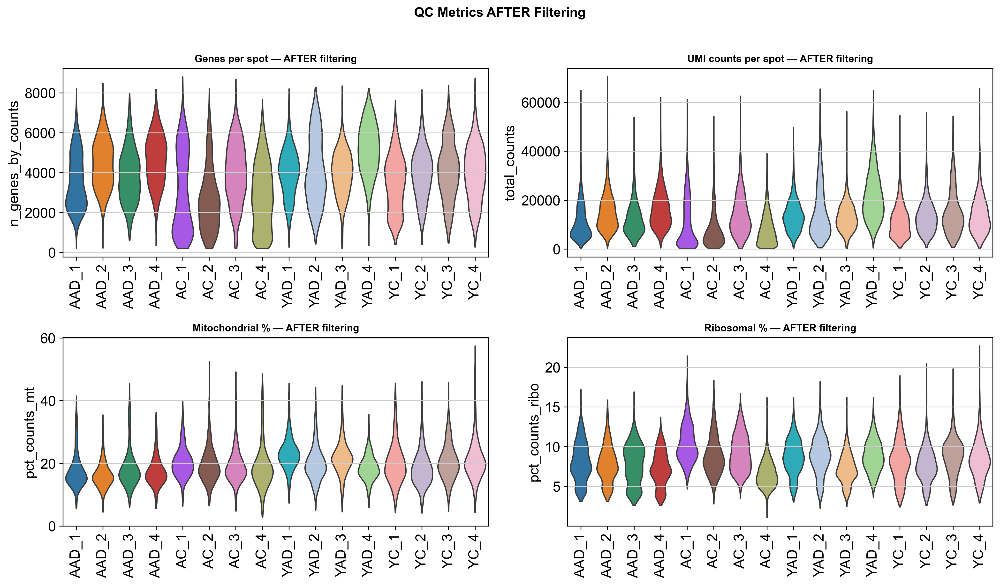

In [142]:
# --- Violin plots AFTER filtering --------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.ravel()

for ax, key, title in zip(axes, qc_keys, qc_titles):
    sc.pl.violin(adata, key, groupby="Sample", rotation=90, ax=ax, show=False,
                 stripplot=False)
    ax.set_title(f"{title} — AFTER filtering", fontsize=10, fontweight="bold")
    ax.set_ylabel(key)

plt.suptitle("QC Metrics AFTER Filtering", fontsize=13, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()


In [143]:
adata.var

,gene_ids,feature_types,genome,mt,ribo,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,n_cells
Rp1,ENSMUSG00000025900,Gene Expression,mm10,False,False,18,0.000418,0.000418,99.958159,18.0,2.944439,18
4930568A12Rik,ENSMUSG00000101223,Gene Expression,mm10,False,False,18,0.000418,0.000418,99.958159,18.0,2.944439,18
Gm37335,ENSMUSG00000104523,Gene Expression,mm10,False,False,13,0.000302,0.000302,99.969781,13.0,2.639057,13
Gm33533,ENSMUSG00000104237,Gene Expression,mm10,False,False,14,0.000325,0.000325,99.967457,14.0,2.708050,14
Il18r1,ENSMUSG00000026070,Gene Expression,mm10,False,False,11,0.000256,0.000256,99.974430,11.0,2.484907,11
...,...,...,...,...,...,...,...,...,...,...,...,...
Gm8817,ENSMUSG00000086008,Gene Expression,mm10,False,False,10,0.000232,0.000232,99.976755,10.0,2.397895,10
Kdm5d,ENSMUSG00000056673,Gene Expression,mm10,False,False,14,0.000325,0.000325,99.967457,14.0,2.708050,14
AC132444.1,ENSMUSG00000079222,Gene Expression,mm10,False,False,16,0.000372,0.000372,99.962808,16.0,2.833213,16
Csprs,ENSMUSG00000062783,Gene Expression,mm10,False,False,19,0.000442,0.000442,99.955834,19.0,2.995732,19


/tmp/ipykernel_2528272/1430362106.py:65: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


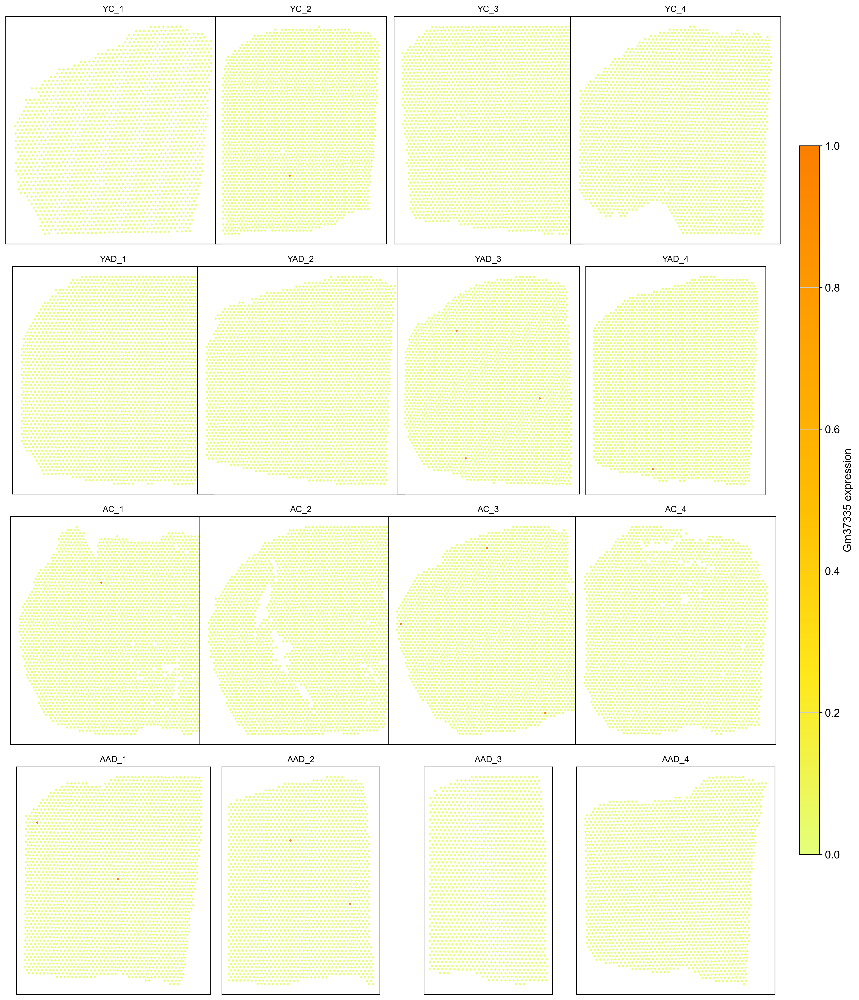

In [165]:
import matplotlib.pyplot as plt
import numpy as np

gene = "Gm37335"

if gene not in adata.var_names:
    raise ValueError(f"{gene} not found in adata.var_names")

sample_order = [
    "YC_1","YC_2","YC_3","YC_4",
    "YAD_1","YAD_2","YAD_3","YAD_4",
    "AC_1","AC_2","AC_3","AC_4",
    "AAD_1","AAD_2","AAD_3","AAD_4",
]

# Get global color scale for consistency across samples
expr_all = adata[:, gene].X
if hasattr(expr_all, "toarray"):
    expr_all = expr_all.toarray().flatten()
else:
    expr_all = np.asarray(expr_all).flatten()

vmin = np.min(expr_all)
vmax = np.max(expr_all)

fig, axes = plt.subplots(4, 4, figsize=(18, 18))

for ax, sample in zip(axes.flat, sample_order):

    ad = adata[adata.obs["Sample"] == sample]

    expr = ad[:, gene].X
    if hasattr(expr, "toarray"):
        expr = expr.toarray().flatten()
    else:
        expr = np.asarray(expr).flatten()

    sc = ax.scatter(
        ad.obsm["spatial"][:, 0],
        ad.obsm["spatial"][:, 1],
        c=expr,
        cmap="Wistia", #"Reds"
        vmin=vmin,
        vmax=vmax,
        s=8,
        linewidth=0,
    )

    ax.set_title(sample, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect("equal")
    ax.invert_yaxis()

# Shared colorbar
fig.subplots_adjust(right=2)   # Leave room on the right

# [left, bottom, width, height] in figure coordinates
cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])

cbar = fig.colorbar(sc, cax=cax)
cbar.set_label(f"{gene} expression")


plt.tight_layout()
plt.show()